# Data Analysis

### Test and Train Data

In [25]:
from data_analysis import create_folder_path

main_folder = '/projectnb/ec523kb/projects/teams_Fall_2024/Team_2/bacteria_counting/Data/2b/DeepBacs_Data_Segmentation_Staph_Aureus_dataset/brightfield_dataset/'

train_or_test = 'test' # train or test
full_images_or_patches = 'patches' # full_images or patches

# Full images train (7 images)
brightfield_folder = create_folder_path(main_folder, train_or_test , full_images_or_patches, 'brightfield')
masks_folder = create_folder_path(main_folder, train_or_test, full_images_or_patches,'masks')

### Visualize Images

patches brightfield: train set
Total number of images: 28
Displaying 28 images (100% of total).


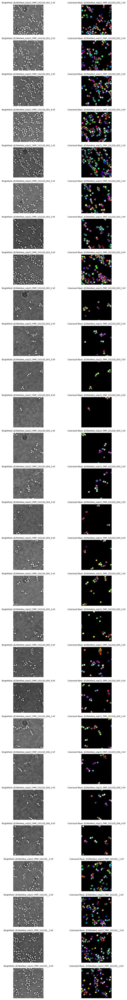

In [20]:
from data_analysis import display_tif_images
exp_str = f"{full_images_or_patches} brightfield: {train_or_test} set"
print(exp_str)
# Analyze and visualize the images with 20% display
display_tif_images(brightfield_folder, masks_folder, display_percentage=100)


### Analyze Metadata

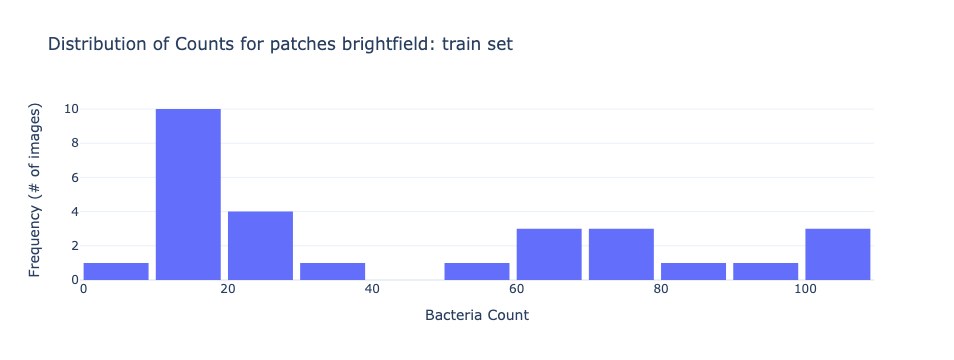

Image Metadata Table for patches brightfield: train set


,Image Name,Brightfield Shape,Mask Shape,Count,Dtype
0,JE2NileRed_oilp22_PMP_101220_001_1.tif,"(256, 256)","(256, 256, 3)",90,"{'Image': uint16, 'mask': uint16}"
1,JE2NileRed_oilp22_PMP_101220_001_2.tif,"(256, 256)","(256, 256, 3)",78,"{'Image': uint16, 'mask': uint16}"
2,JE2NileRed_oilp22_PMP_101220_001_3.tif,"(256, 256)","(256, 256, 3)",85,"{'Image': uint16, 'mask': uint16}"
3,JE2NileRed_oilp22_PMP_101220_001_4.tif,"(256, 256)","(256, 256, 3)",109,"{'Image': uint16, 'mask': uint16}"
4,JE2NileRed_oilp22_PMP_101220_002_1.tif,"(256, 256)","(256, 256, 3)",102,"{'Image': uint16, 'mask': uint16}"
5,JE2NileRed_oilp22_PMP_101220_002_2.tif,"(256, 256)","(256, 256, 3)",67,"{'Image': uint16, 'mask': uint16}"
6,JE2NileRed_oilp22_PMP_101220_002_3.tif,"(256, 256)","(256, 256, 3)",51,"{'Image': uint16, 'mask': uint16}"
7,JE2NileRed_oilp22_PMP_101220_002_4.tif,"(256, 256)","(256, 256, 3)",108,"{'Image': uint16, 'mask': uint16}"
8,JE2NileRed_oilp22_PMP_101220_003_1.tif,"(256, 256)","(256, 256, 3)",15,"{'Image': uint16, 'mask': uint8}"
9,JE2NileRed_oilp22_PMP_101220_003_2.tif,"(256, 256)","(256, 256, 3)",19,"{'Image': uint16, 'mask': uint8}"


In [21]:
from data_analysis import get_metadata, plot_count_histogram

# Get metadata
metadata_table = get_metadata(brightfield_folder, masks_folder)

# Plot the histogram
plot_count_histogram(metadata_table, title= f"Distribution of Counts for {exp_str}")

print(f"Image Metadata Table for {exp_str}")
display(metadata_table)

# Data Augmentation

Count before augmentations: 32
Count after augmentations: 96


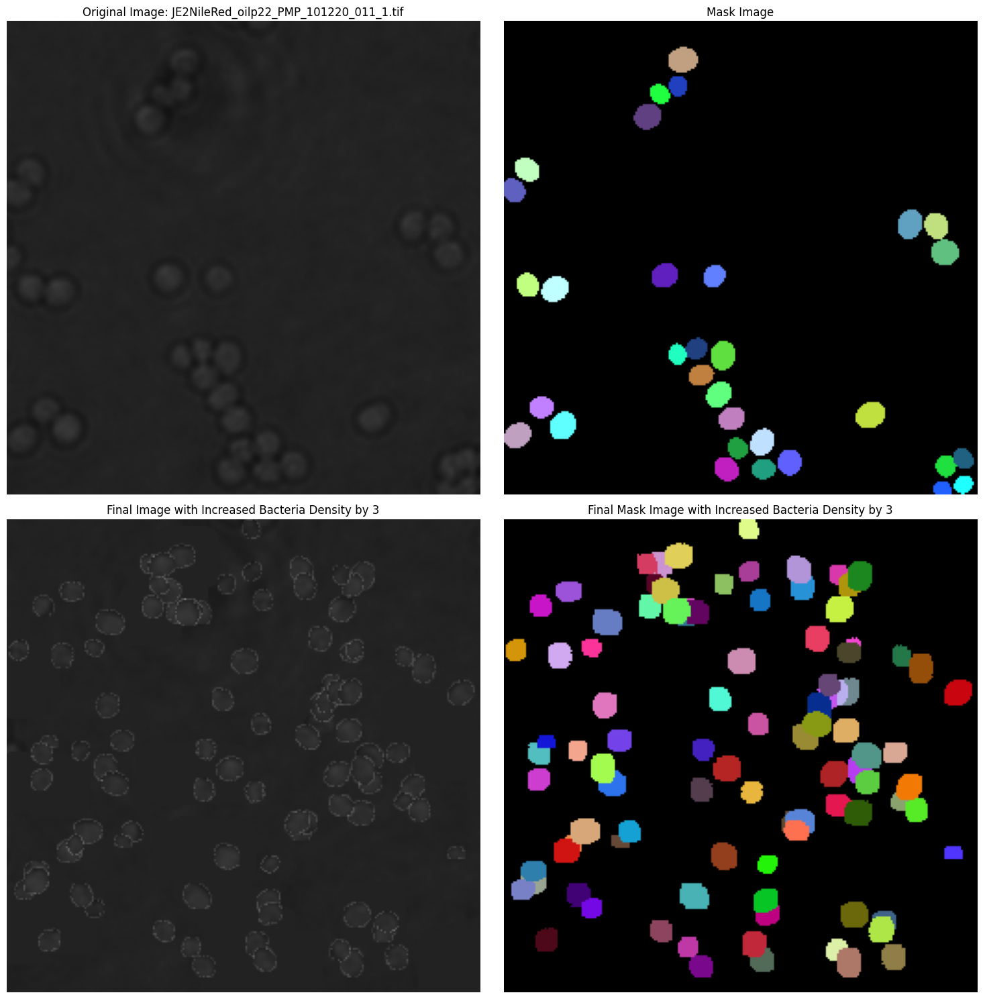

In [4]:
from augmentations import process_images
from data_analysis import count_segments
import os

img_path = "JE2NileRed_oilp22_PMP_101220_011_1.tif"
mask_path = "JE2NileRed_oilp22_PMP_101220_011_1.tif"

original_image_path = os.path.join(brightfield_folder, img_path)
mask_image_path = os.path.join(masks_folder, mask_path)

density_factor = 3

original_image_rgb, mask_image_rgb, final_rgb, final_mask_rgb= process_images(
    original_image_path,
    mask_image_path,
    visualize_individual=True,
    display_plots=True,
    density_factor=density_factor  
)

Count before augmentations: 28
Count after augmentations: 84


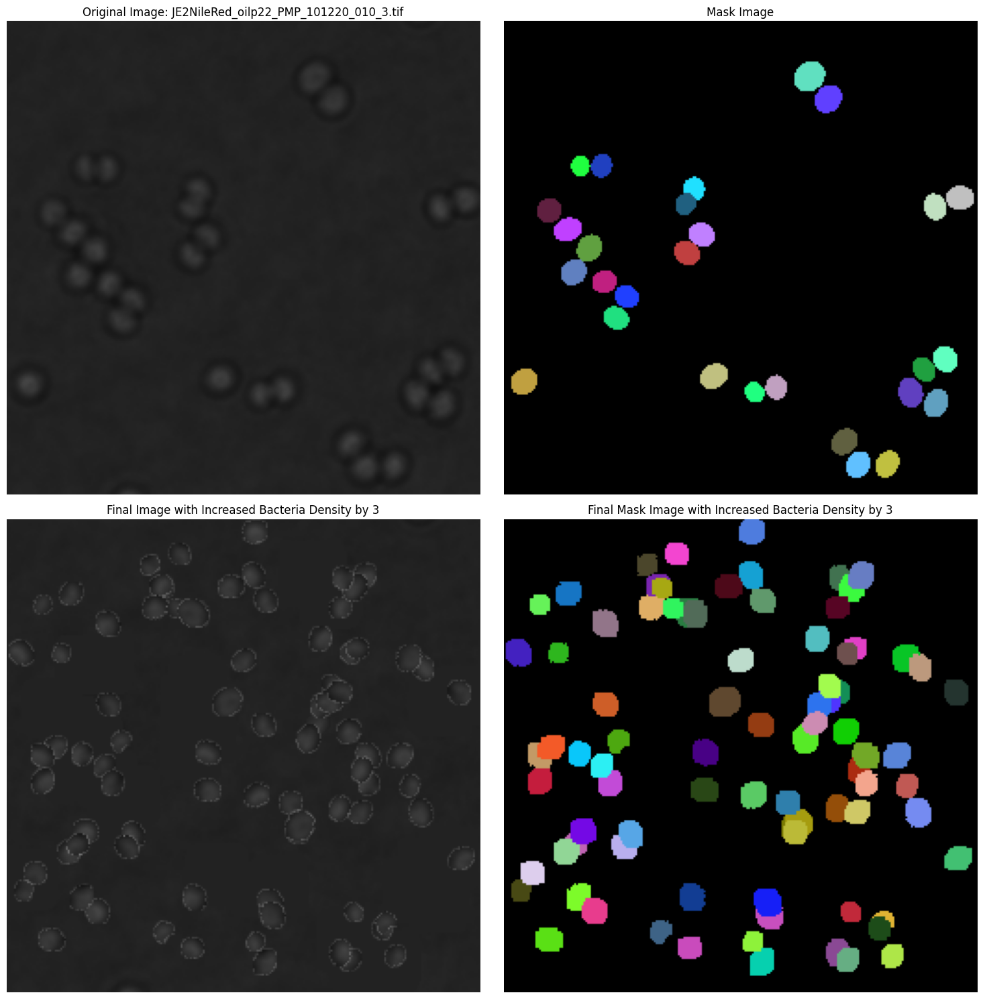

Count before augmentations: 22
Count after augmentations: 66


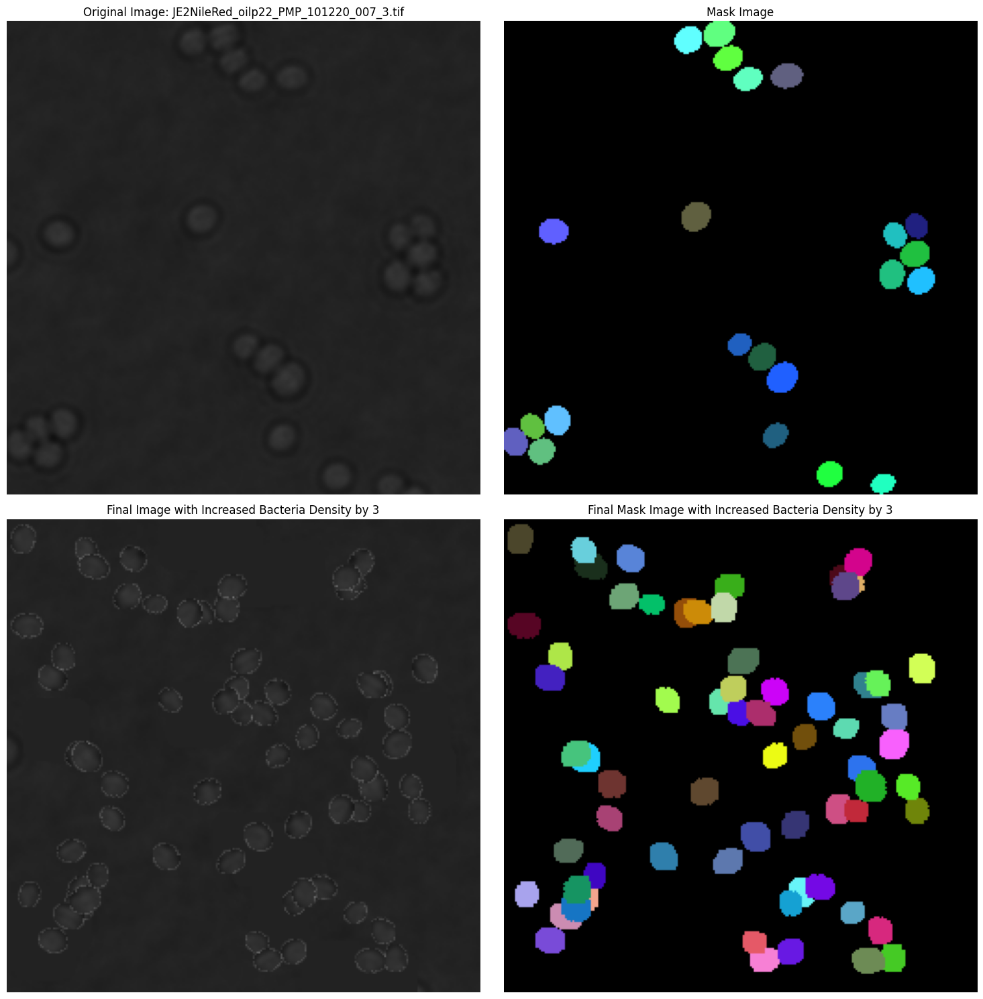

Count before augmentations: 22
Count after augmentations: 66


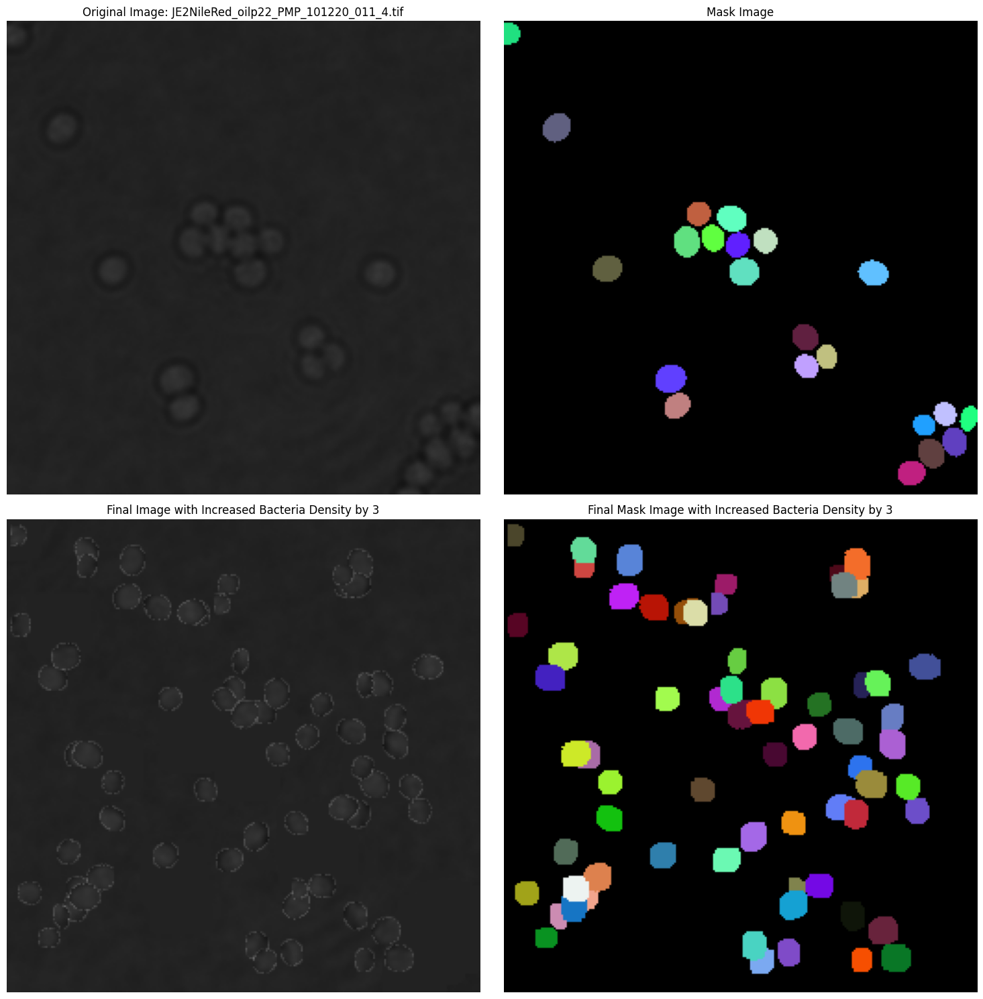

Count before augmentations: 14
Count after augmentations: 42


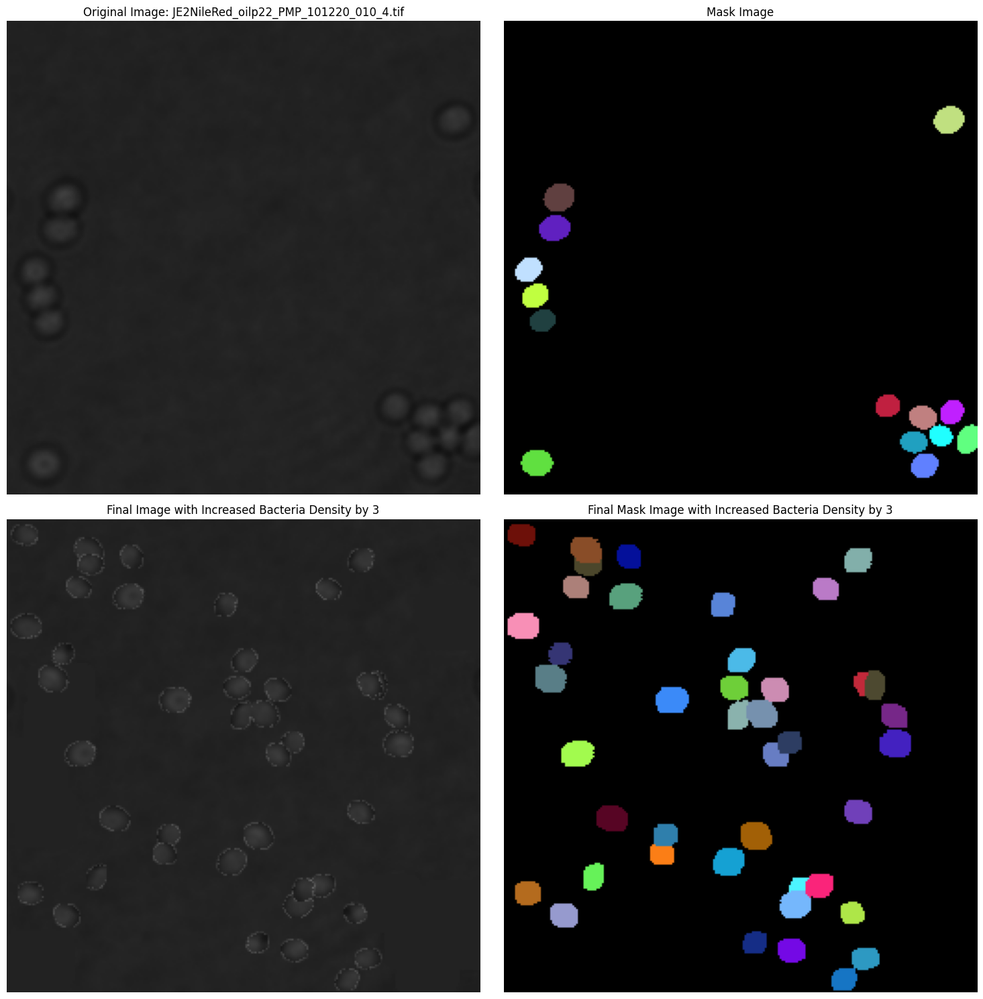

Count before augmentations: 24
Count after augmentations: 72


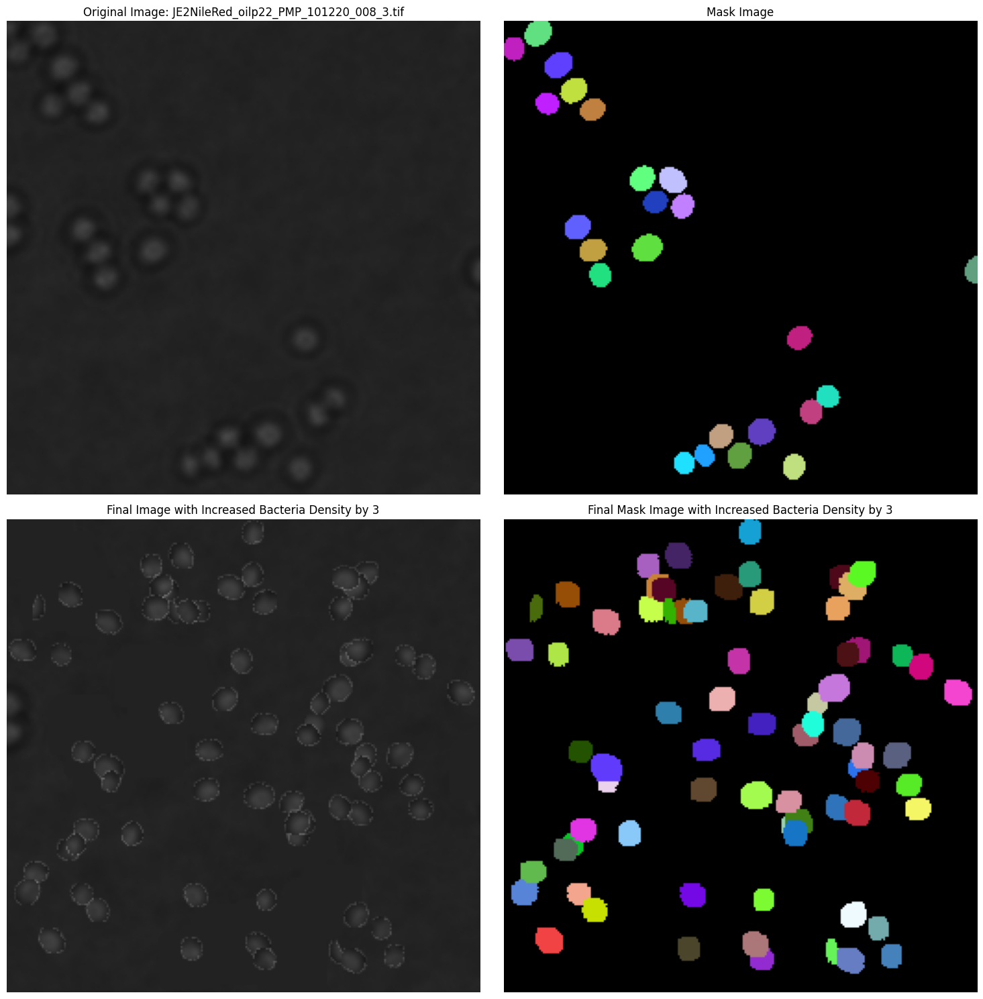

Count before augmentations: 16
Count after augmentations: 48


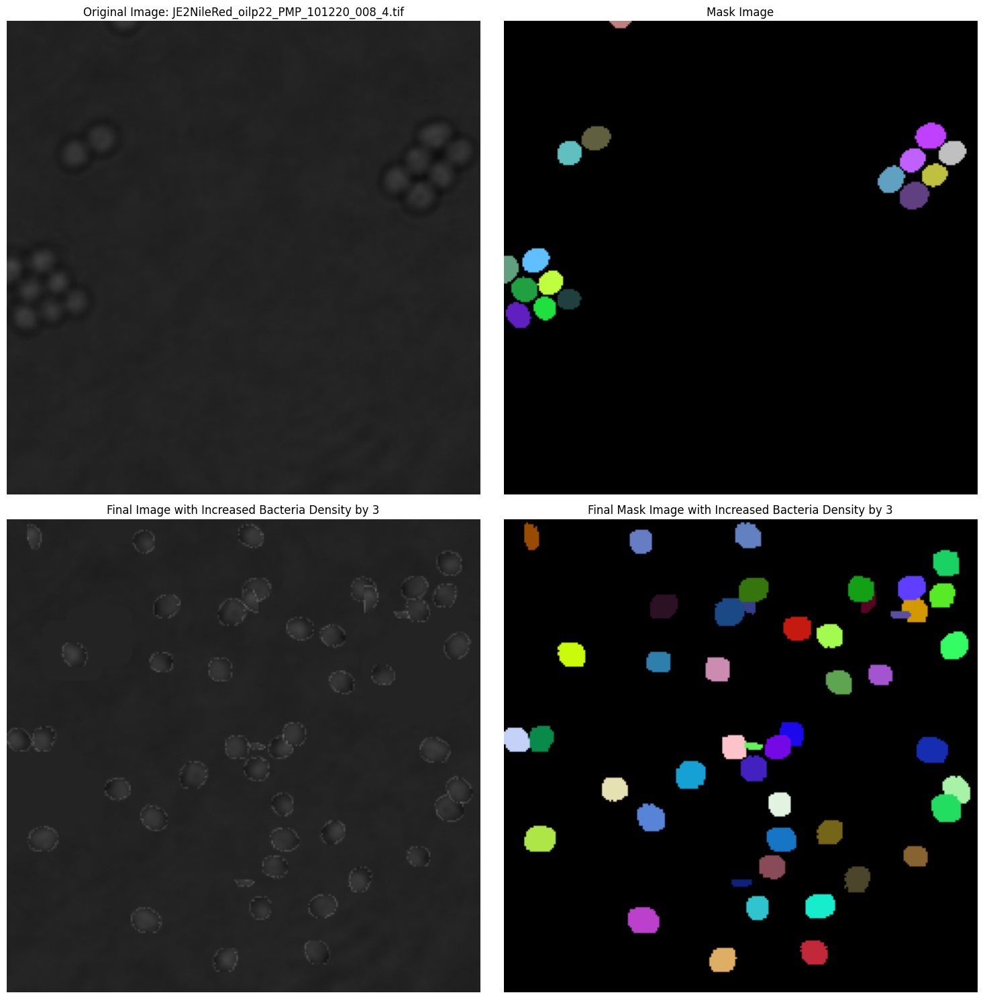

Count before augmentations: 49
Count after augmentations: 146


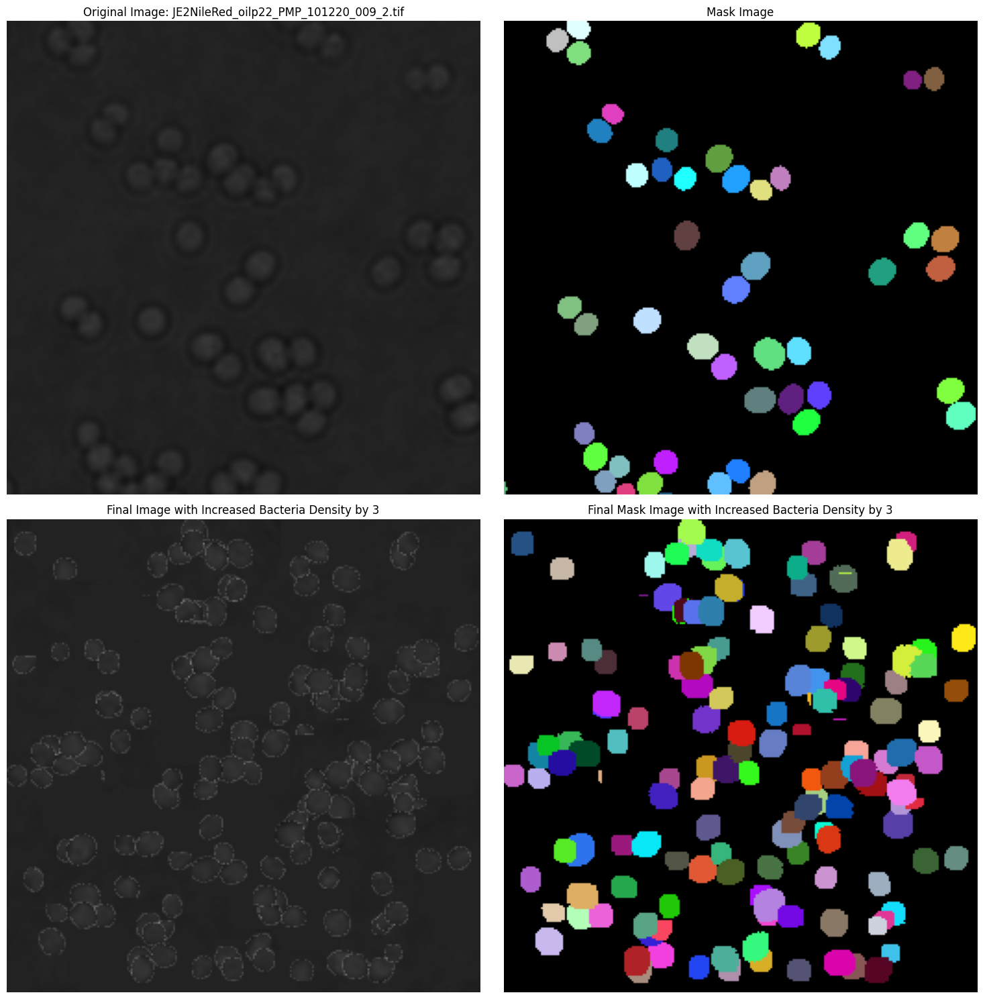

Count before augmentations: 32
Count after augmentations: 96


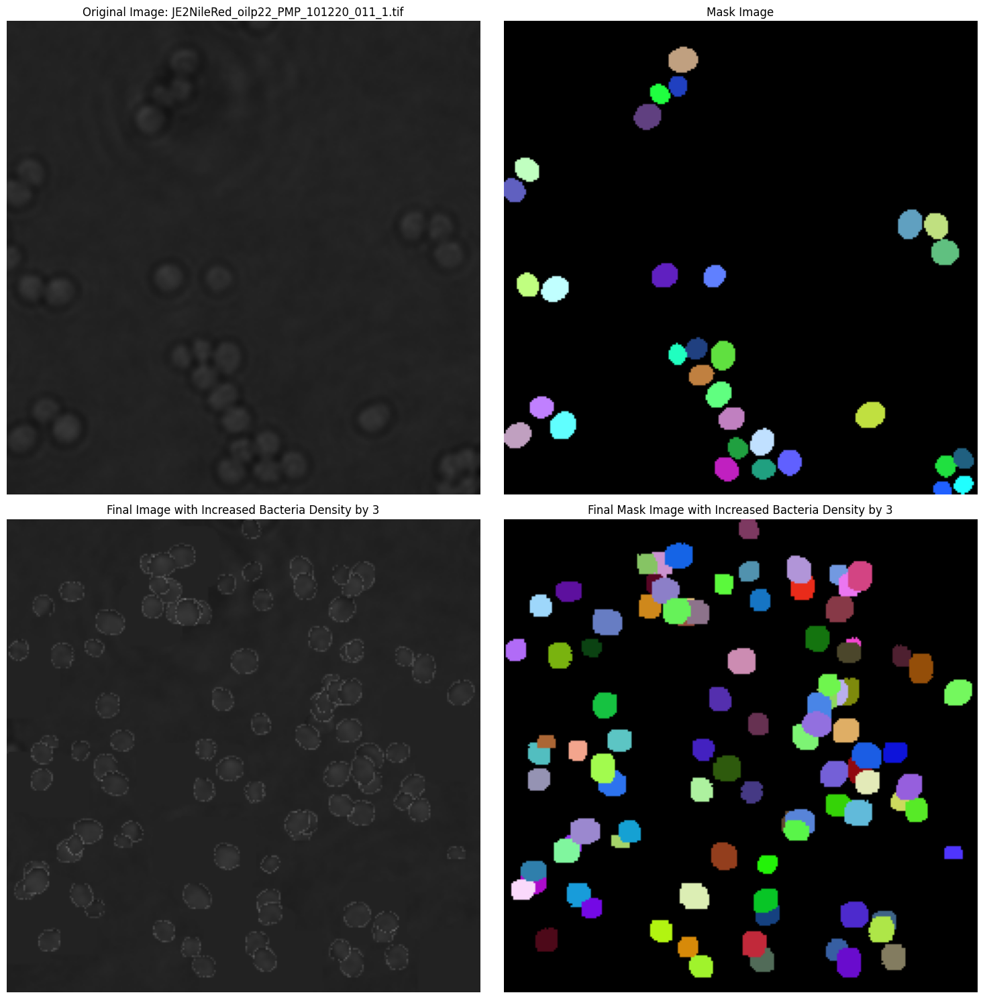

Count before augmentations: 27
Count after augmentations: 81


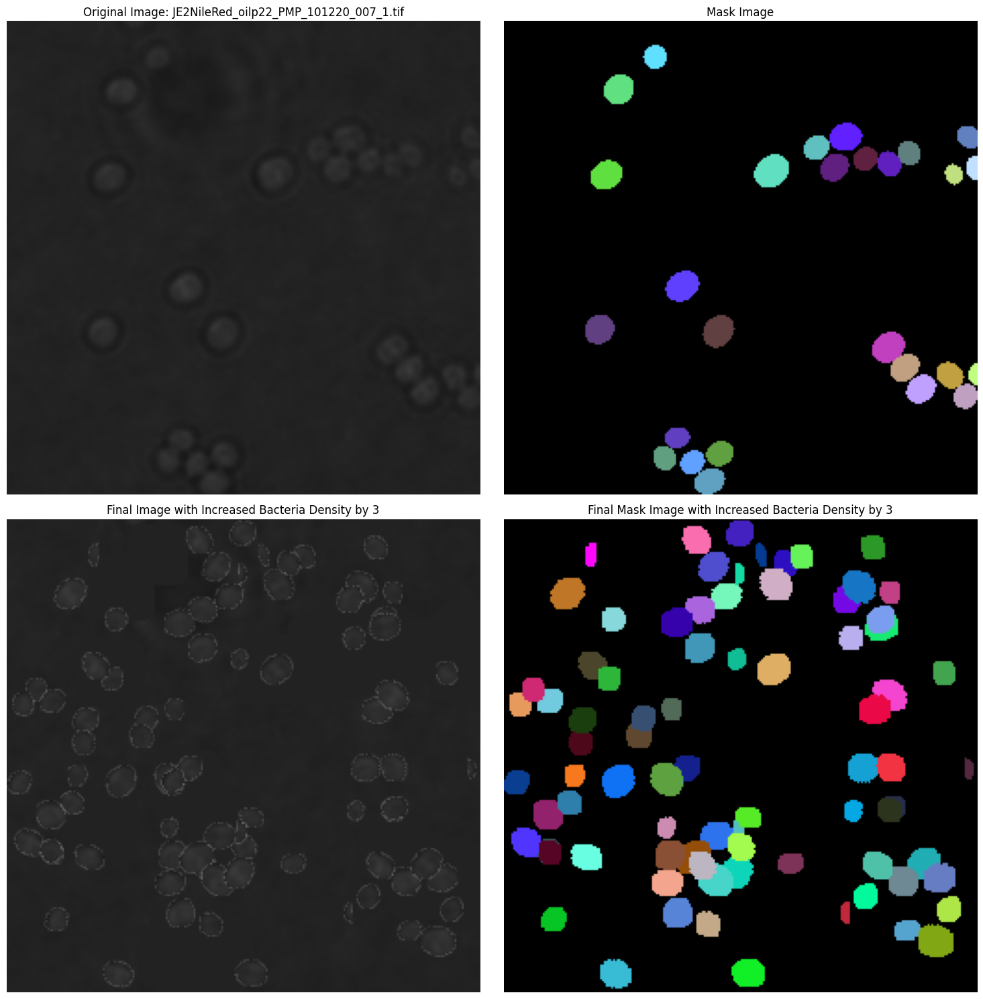

Count before augmentations: 17
Count after augmentations: 51


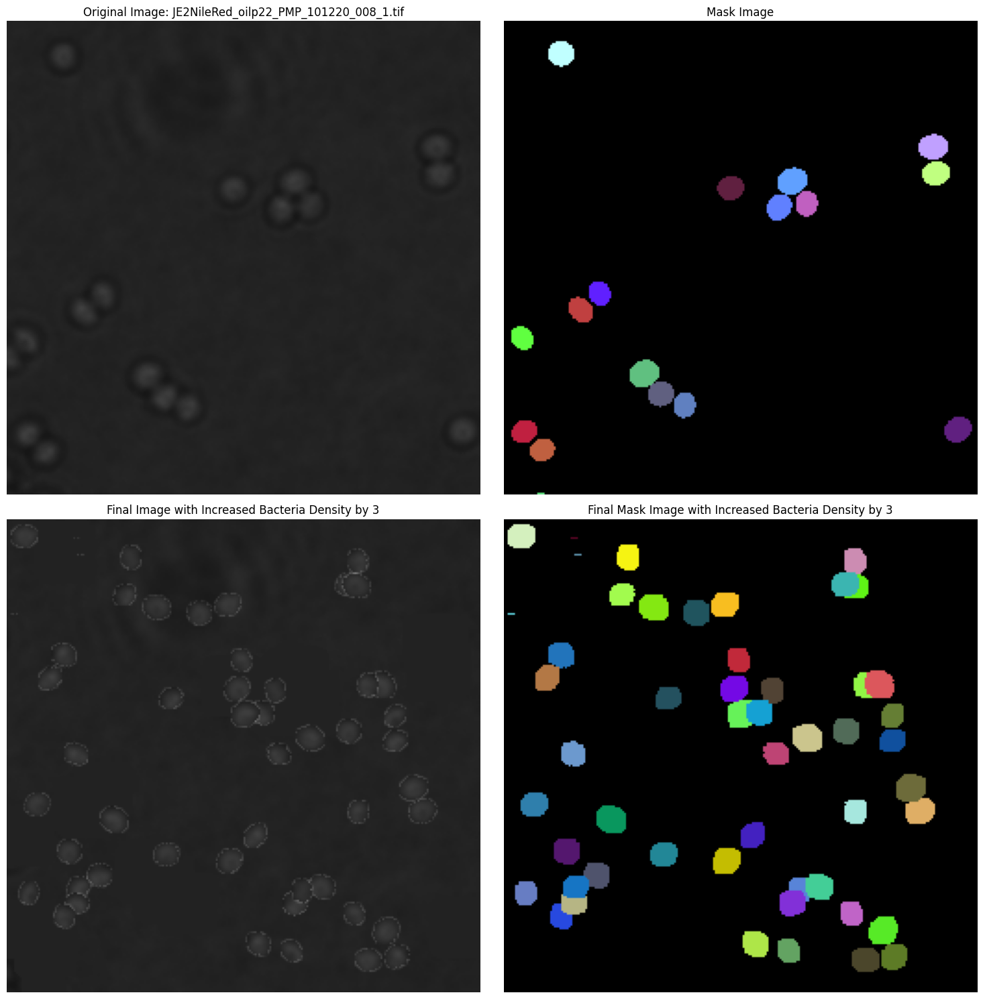

Count before augmentations: 14
Count after augmentations: 42


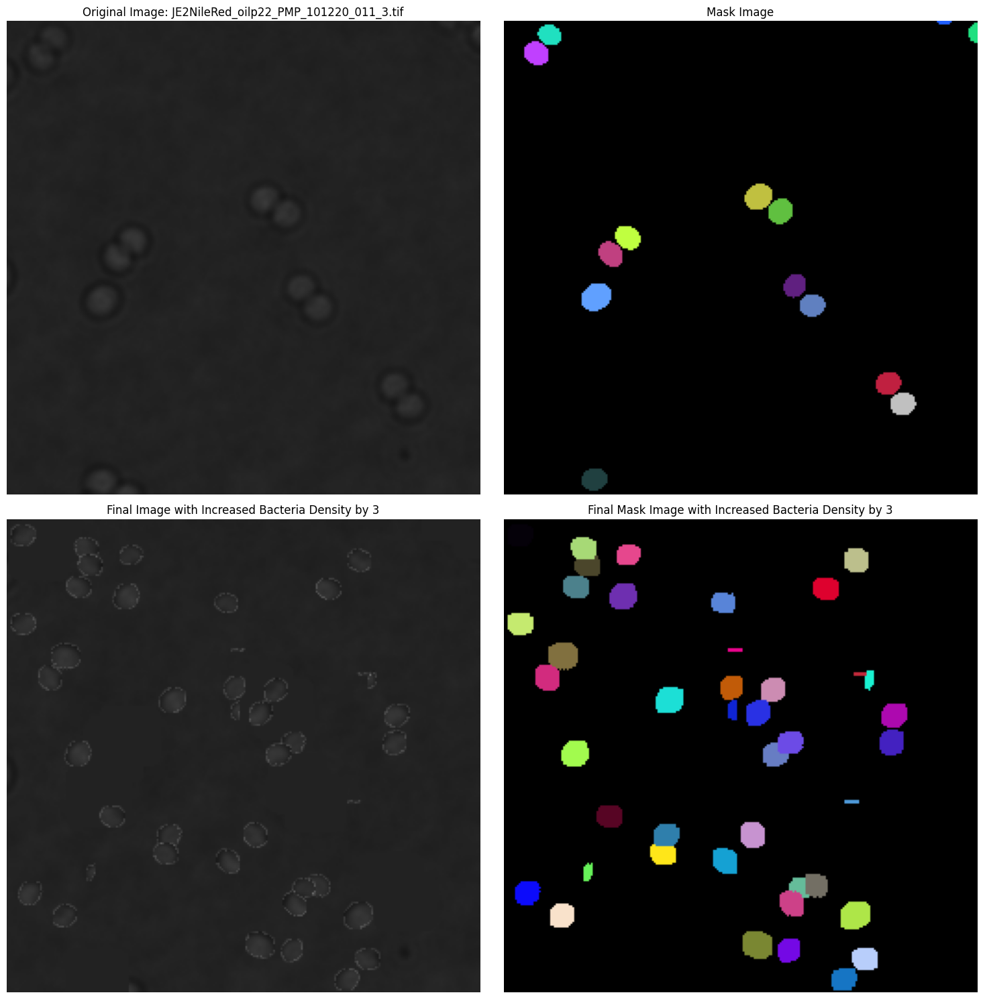

Count before augmentations: 21
Count after augmentations: 63


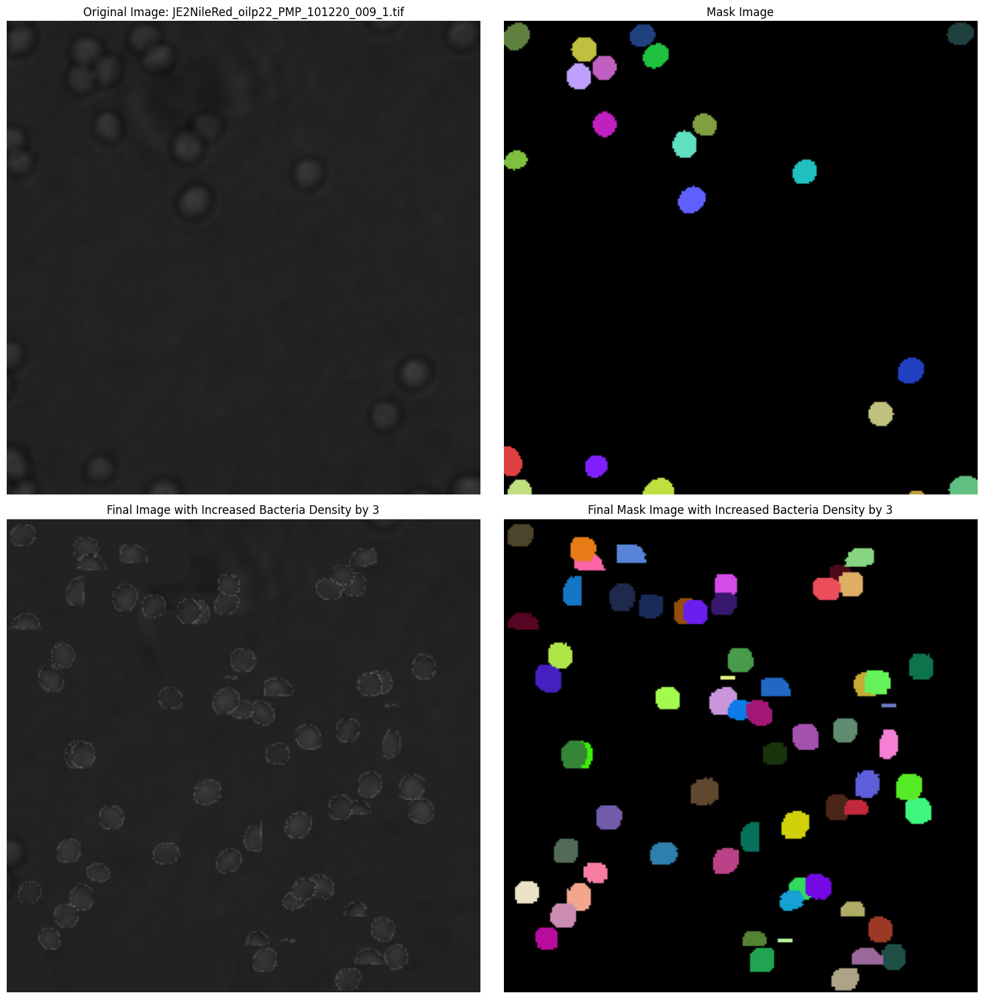

Count before augmentations: 23
Count after augmentations: 69


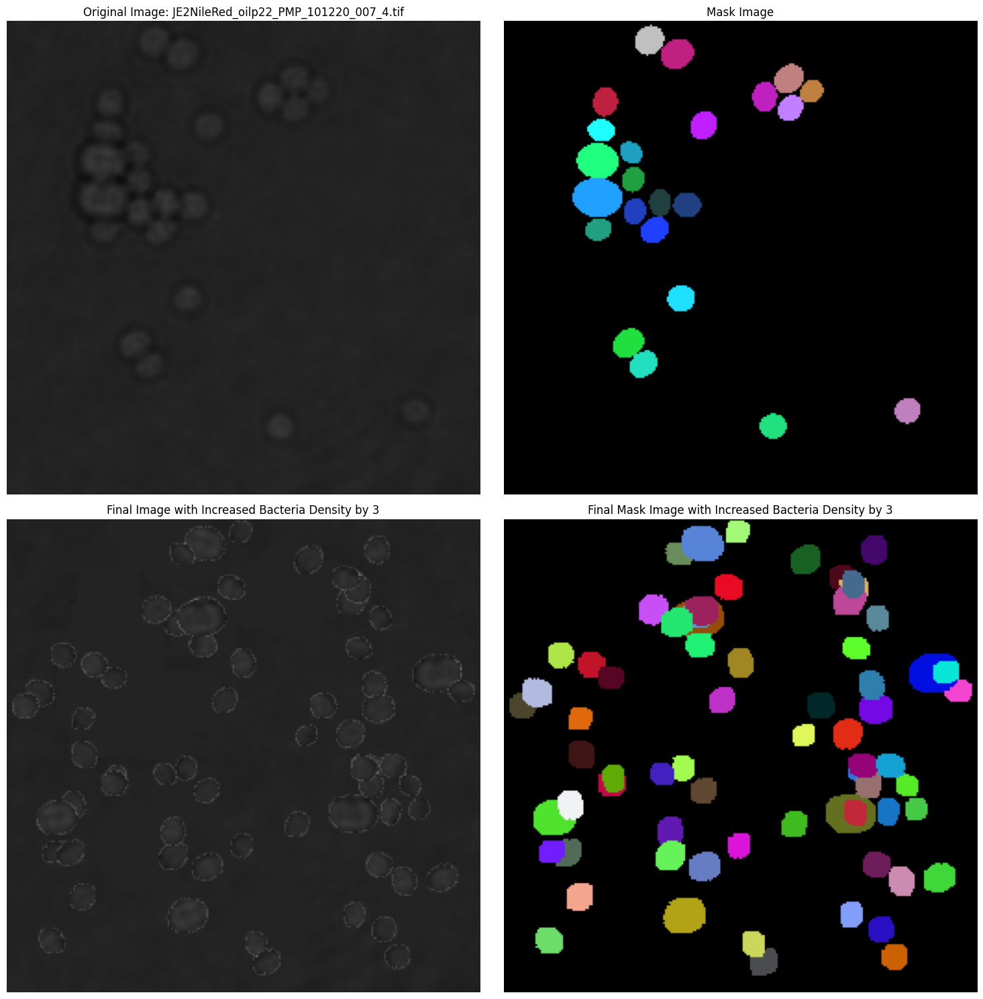

Count before augmentations: 35
Count after augmentations: 104


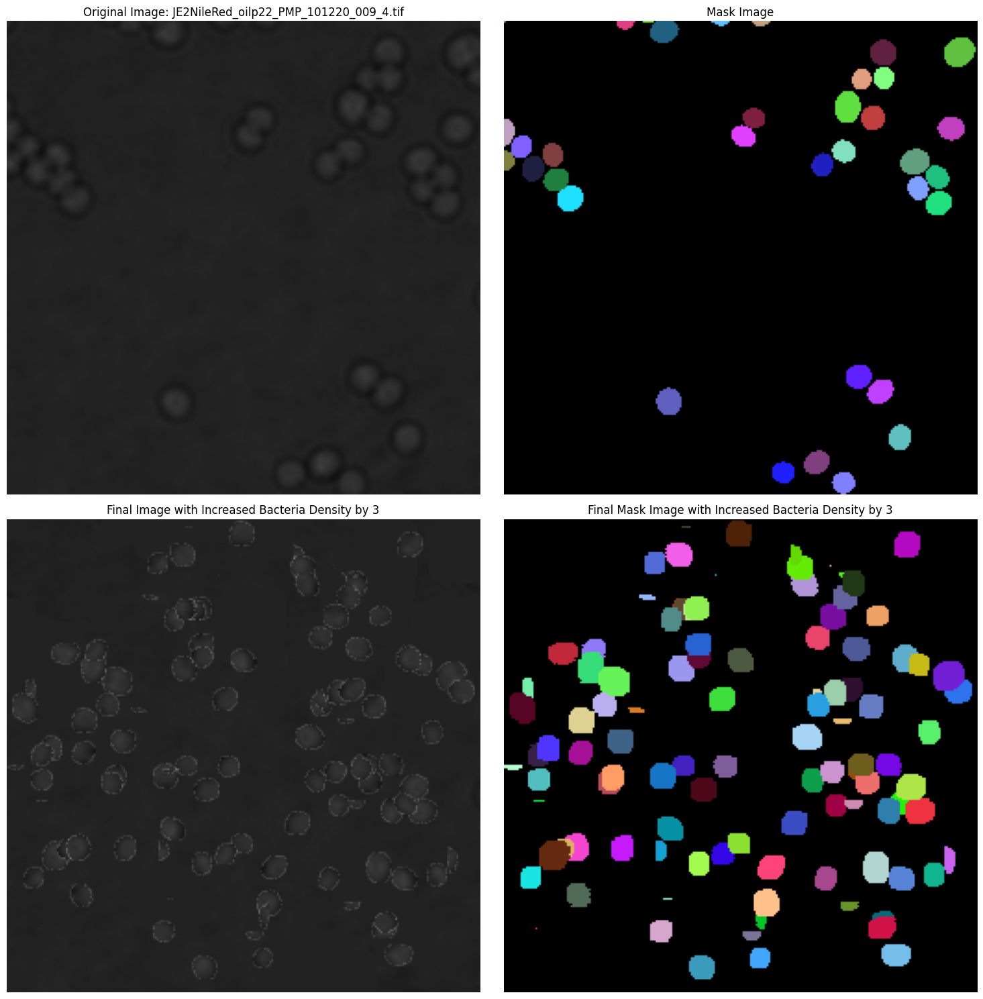

Count before augmentations: 20
Count after augmentations: 59


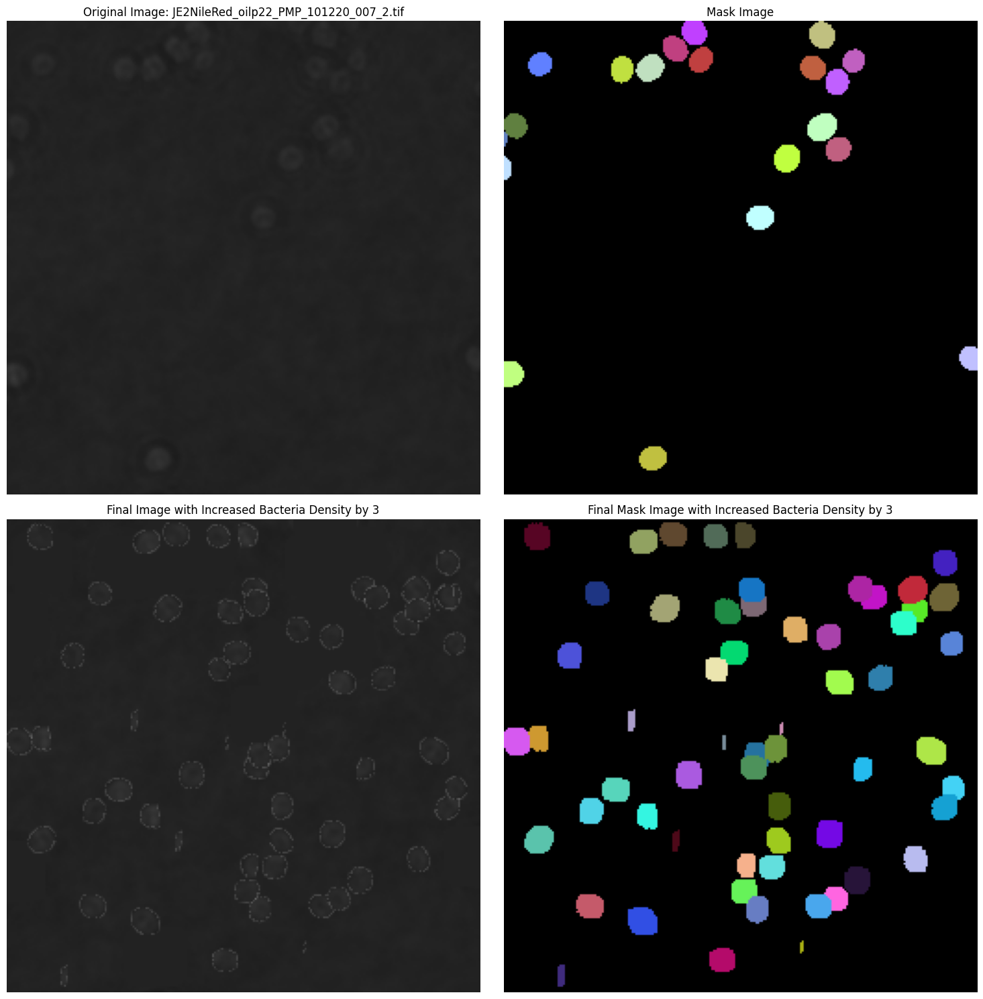

Count before augmentations: 51
Count after augmentations: 153


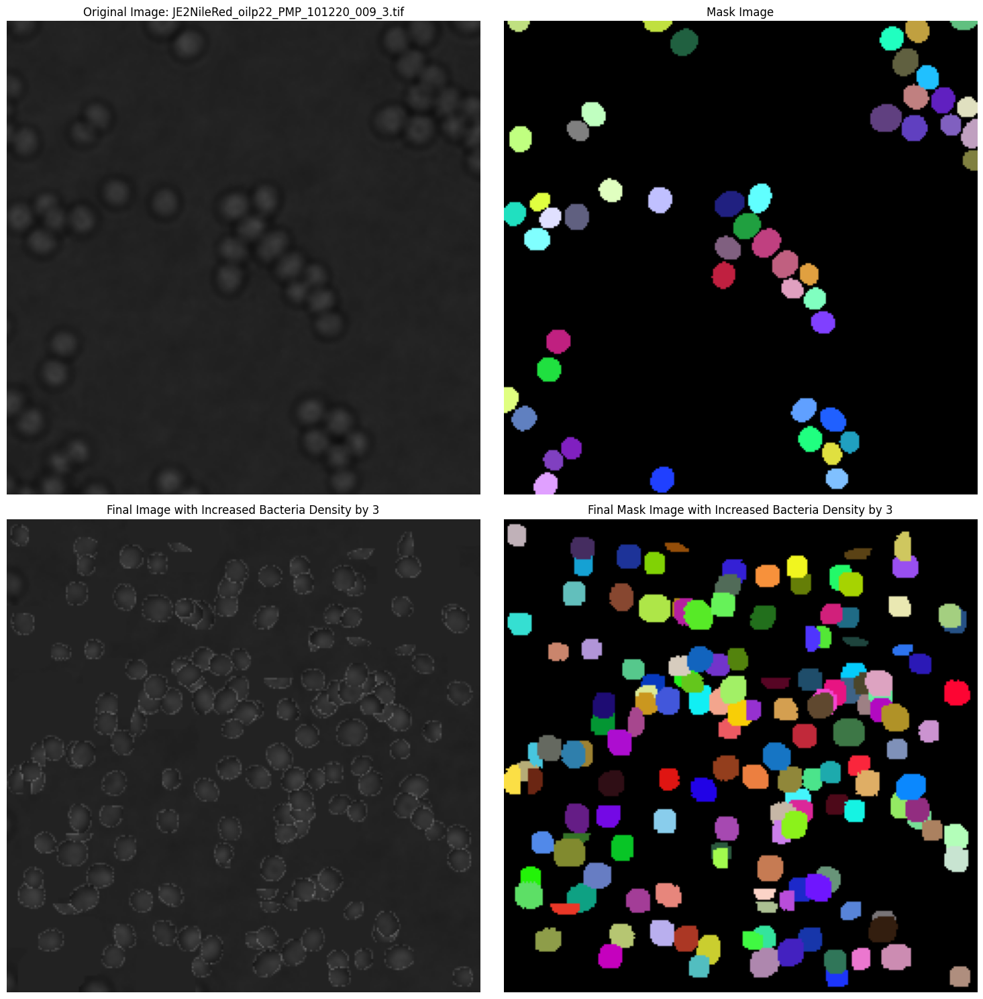

Count before augmentations: 18
Count after augmentations: 54


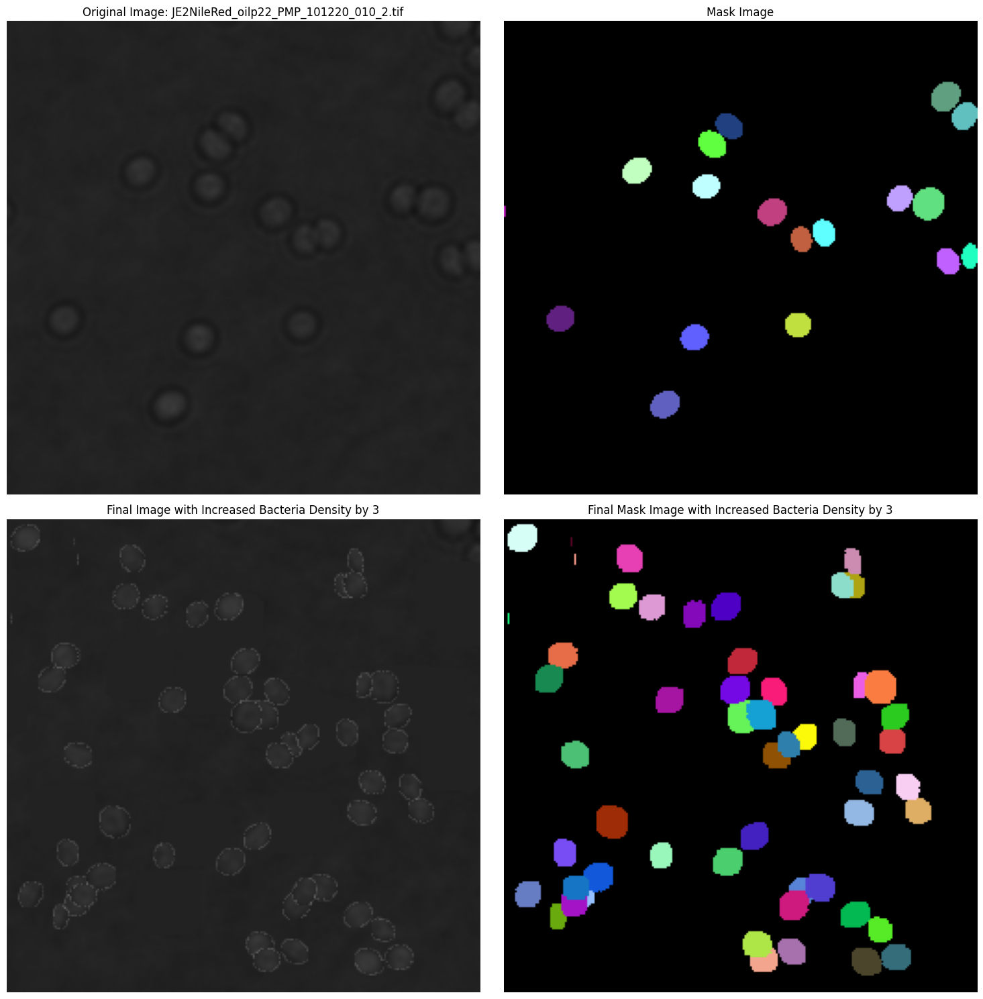

Count before augmentations: 22
Count after augmentations: 66


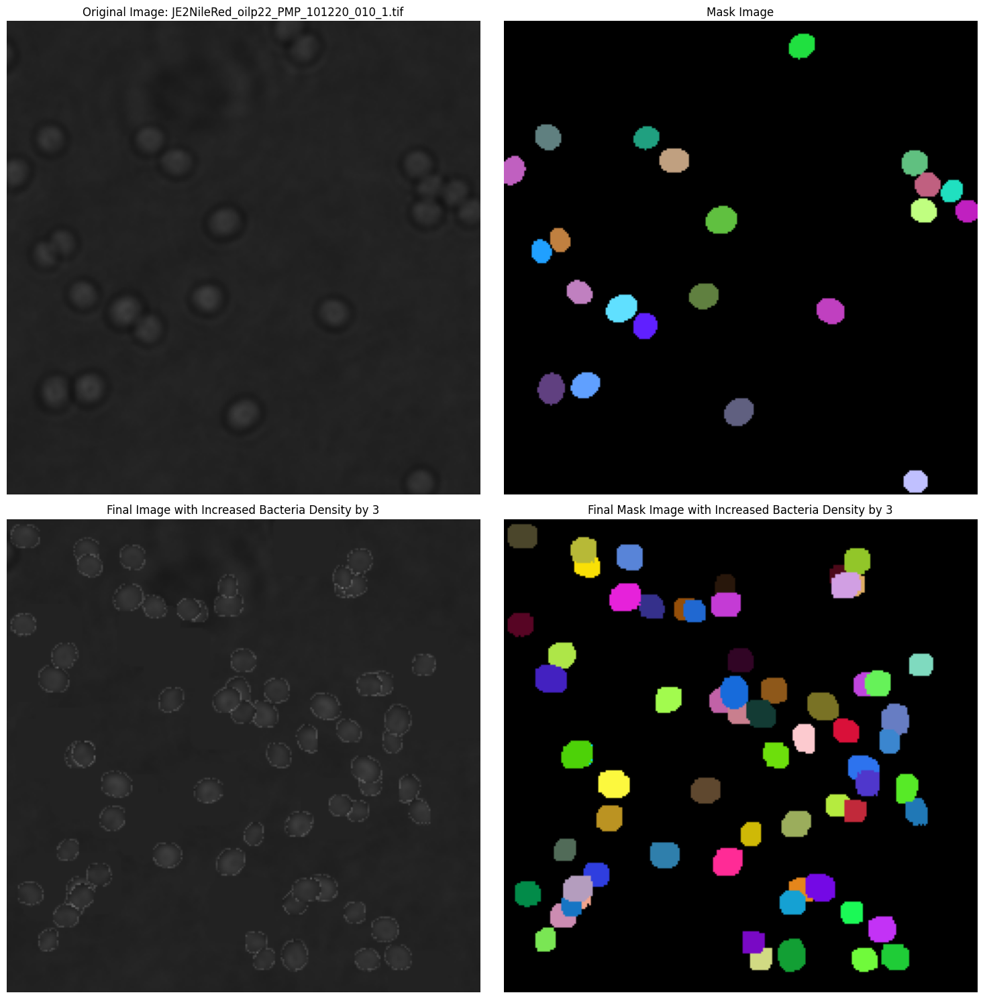

Count before augmentations: 16
Count after augmentations: 48


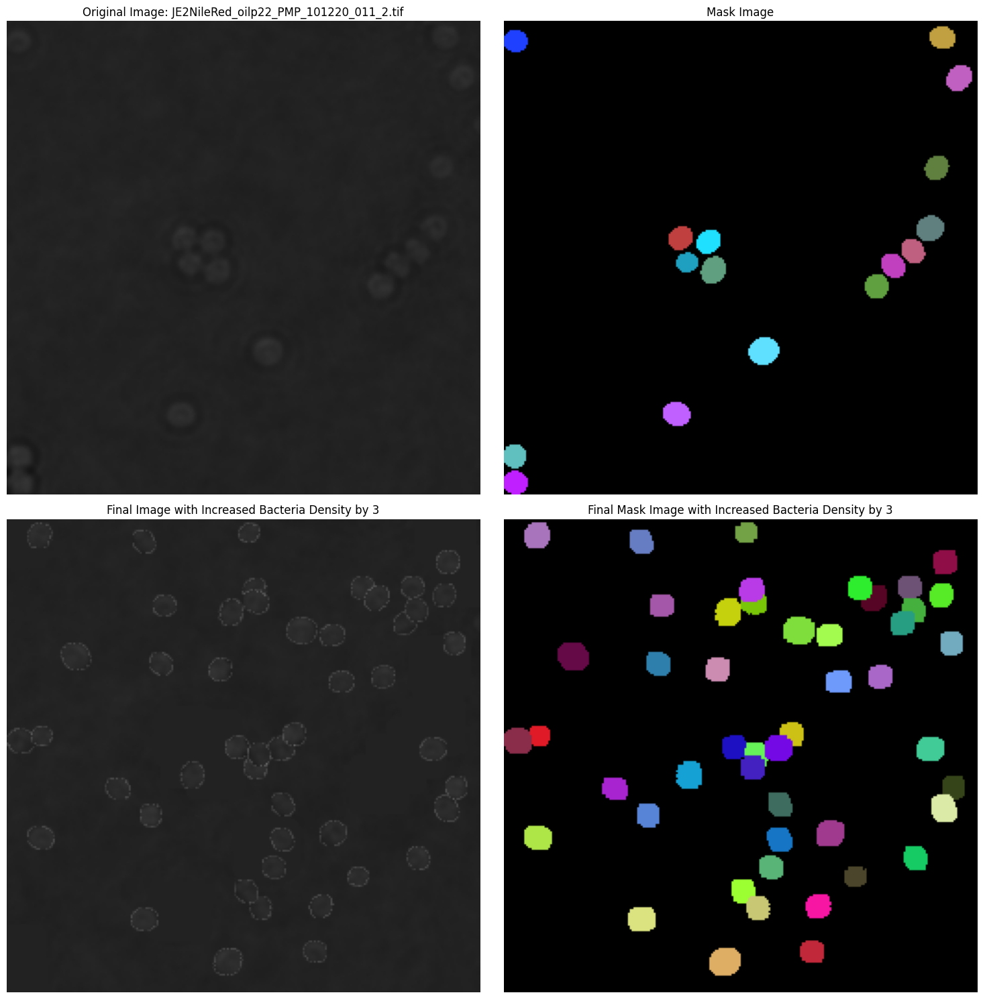

Count before augmentations: 21
Count after augmentations: 63


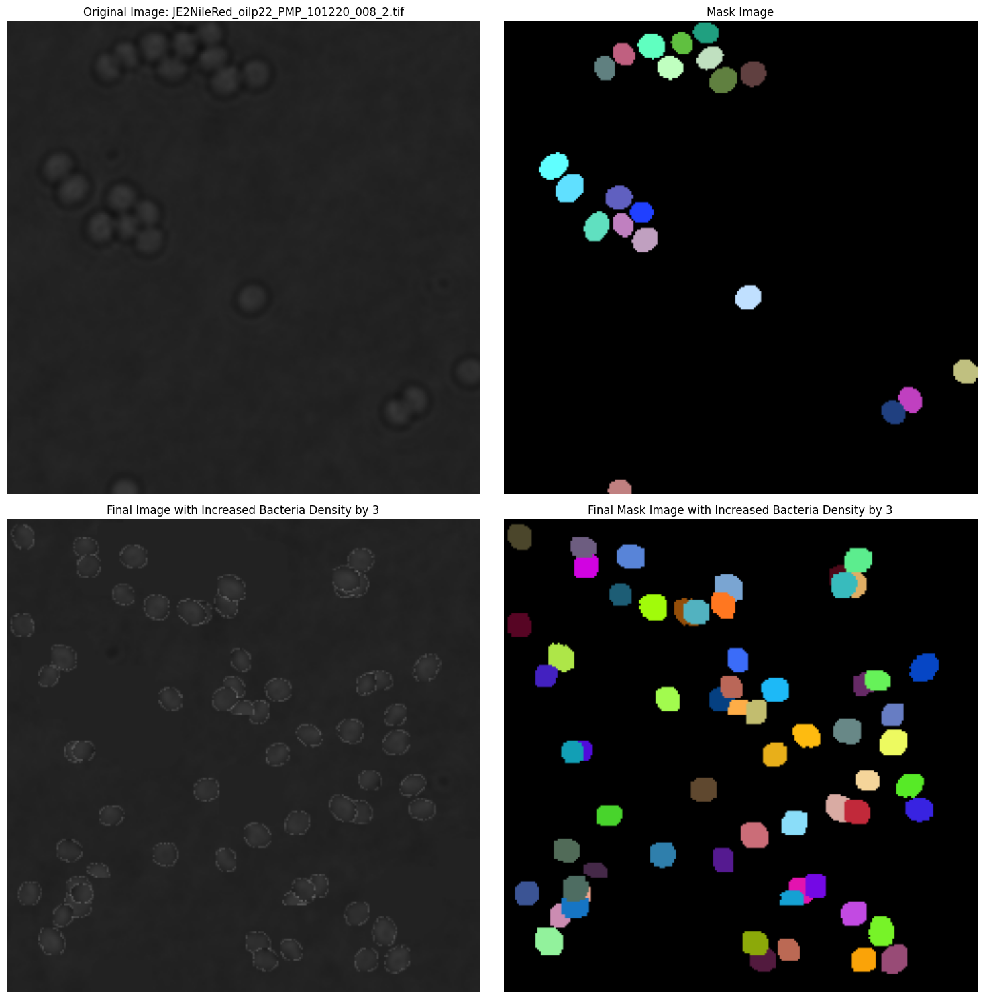

In [5]:
from augmentations import augment_images_in_folder
# Call the function to create augmented images in the specified folder
augment_images_in_folder(brightfield_folder, masks_folder, density_factor)

# Histogram After Augmentation

In [22]:
import cv2
import pandas as pd
def combine_and_plot_histogram(folder_mask_pairs, title="Distribution of Counts After Augmentation"):
    """
    Combines images and masks from multiple folder-mask pairs, calculates counts,
    and creates a combined histogram using Plotly.

    Args:
        folder_mask_pairs (list of tuples): List of (image_folder, mask_folder) pairs.
        title (str): Title of the histogram.

    Returns:
        pd.DataFrame: Combined metadata DataFrame.
    """
    combined_metadata = []

    for image_folder, mask_folder in folder_mask_pairs:
        image_files = [f for f in os.listdir(image_folder) if f.endswith(('tif', 'png', 'jpg', 'jpeg'))]
        mask_files = [f for f in os.listdir(mask_folder) if f.endswith(('tif', 'png', 'jpg', 'jpeg'))]

        # Match images and masks by filenames
        common_files = sorted(list(set(image_files) & set(mask_files)))

        for file in common_files:
            image_path = os.path.join(image_folder, file)
            mask_path = os.path.join(mask_folder, file)

            # Read mask
            mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
            if mask is None:
                print(f"Skipping {file} as the mask could not be read.")
                continue

            # Calculate count using count_segments
            count = count_segments(mask, method="color")  # Ensure count_segments is implemented

            # Append metadata
            combined_metadata.append({
                "Image": image_path,
                "Mask": mask_path,
                "Count": count
            })

    # Convert combined metadata to DataFrame
    metadata_df = pd.DataFrame(combined_metadata)

    # Plot the histogram
    plot_count_histogram(metadata_df, title)

    return metadata_df

/projectnb/ec523kb/projects/teams_Fall_2024/Team_2/bacteria_counting/Data/2b/DeepBacs_Data_Segmentation_Staph_Aureus_dataset/brightfield_dataset/test/patches/augmented_brightfield_dens_3


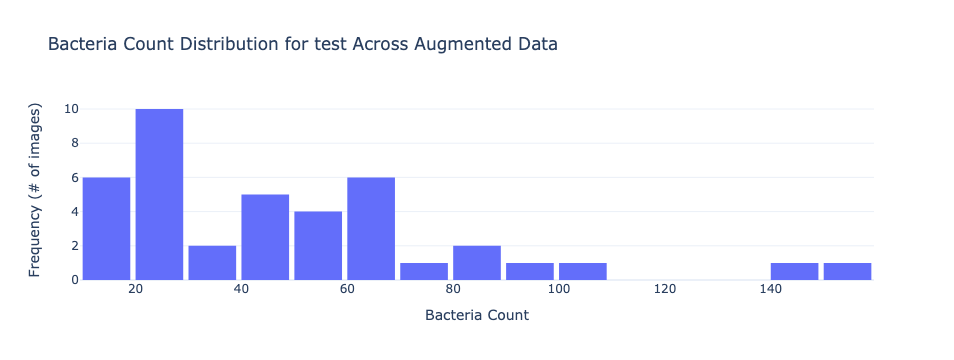

In [26]:
# Augmented paths
augmented_brightfield_folder = create_folder_path(main_folder, train_or_test , full_images_or_patches, 'augmented_brightfield_dens_3')
augmented_masks_folder = create_folder_path(main_folder, train_or_test, full_images_or_patches,'augmented_masks_dens_3')
print(augmented_brightfield_folder)
# Define folder-mask pairs
folder_mask_pairs = [
    (brightfield_folder, masks_folder),
    (augmented_brightfield_folder, augmented_masks_folder),
]

# Combine and plot histogram
combined_metadata = combine_and_plot_histogram(folder_mask_pairs, 
                                               title=f"Bacteria Count Distribution for {train_or_test} Across Augmented Data")
